In [2]:
from typing import Dict, List

import arviz
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
from dataandcoords import set_data_and_coords
from gpapproximation import make_gp_basis, sample_all
from posteriorplots import predictive_plot, retrodictive_plot
from zerosumnormal import ZeroSumNormal

if pm.math.erf.__module__.split(".")[0] == "theano":
    import theano.tensor as aet
else:
    import aesara.tensor as aet

In [2]:
from model_builder import ModelBuilder

In [3]:
arviz.style.use("arviz-darkgrid")
RANDOM_SEED = 8927
np.random.seed(286)

## Data

In [3]:
%load_ext autoreload
%autoreload 2

In [5]:
TEST_CUTOFF = pd.Timedelta(8, "W")
(polls_train, polls_test, results, PARTIES_COMPLETE) = set_data_and_coords(TEST_CUTOFF)
_, UNIQUE_ELECTIONS = polls_train["dateelection"].factorize()
_, UNIQUE_POLLSTERS = polls_train["sondage"].factorize()

/Users/alex_andorra/repos/pollsposition/models/presidential-elections/dataandcoords.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], date).astype(int)


In [6]:
polls_train

,date,sondage,dateelection,countdown,samplesize,farleft,left,green,center,right,farright,other
0,2002-01-02,BVA,2002-04-21,109,919,64,221,64,46,193,92,239
1,2002-01-03,CSA,2002-04-21,108,997,50,214,60,40,279,100,254
2,2002-01-04,Ipsos,2002-04-21,107,5297,318,1218,265,212,1483,477,1324
3,2002-01-05,BVA,2002-04-21,106,500,35,120,35,15,135,45,115
4,2002-01-05,Kantar,2002-04-21,106,763,53,183,46,23,206,69,183
...,...,...,...,...,...,...,...,...,...,...,...,...
341,2017-02-23,Odoxa,2017-04-23,59,884,106,115,0,221,168,239,35
342,2017-02-24,Kantar,2017-04-23,58,700,70,98,0,175,140,189,28
343,2017-02-25,Ifop,2017-04-23,57,1200,138,162,0,294,240,312,54
344,2017-02-25,OpinionWay,2017-04-23,57,1038,114,156,0,249,218,270,31


### Add predictors

#### Election results for sample size

In [7]:
# need number of people who voted
raw_json = pd.read_json(
    "https://raw.githubusercontent.com/pollsposition/data/main/resultats/presidentielles.json",
)
raw_json = raw_json.loc["premier_tour"].to_dict()

In [8]:
jsons = []
for year, dateelection in zip(
    results.dateelection.dt.year.unique(), results.dateelection.unique()
):
    df = pd.json_normalize(raw_json[year])[["exprimes"]]
    df["dateelection"] = dateelection
    jsons.append(df)
jsons = pd.concat(jsons)

In [9]:
results_mult = (
    results.join(jsons.set_index("dateelection"), on="dateelection")
    .drop("samplesize", axis="columns")
    .rename(columns={"exprimes": "samplesize"})
)
results_mult["samplesize"] = (
    results_mult["samplesize"] // 100
)  # to prevent overflow in Multinomial

In [10]:
results_mult[PARTIES_COMPLETE] = (
    (results_mult[PARTIES_COMPLETE] / 100)
    .mul(results_mult["samplesize"], axis=0)
    .round()
    .fillna(0)
    .astype(int)
)
results_mult["samplesize"] = results_mult[PARTIES_COMPLETE].sum(1)

In [11]:
results_mult

,dateelection,date,countdown,sondage,farleft,left,green,center,right,farright,other,samplesize
74,2002-04-21,2002-04-21,0,result,16301,46110,14962,19493,56655,48048,83415,284984
141,2007-04-22,2007-04-22,0,result,19865,94993,5765,68188,114491,38335,25557,367194
294,2012-04-22,2012-04-22,0,result,39830,102734,8289,32761,97531,64231,13456,358832
439,2017-04-23,2017-04-23,0,result,70594,22931,0,86566,72145,76796,31511,360543


#### Unemployment

In [12]:
unemp = pd.read_csv(
    "https://raw.githubusercontent.com/pollsposition/data/main/predicteurs/chomage_national_trim.csv",
    sep=";",
    skiprows=2,
).iloc[:, [0, 1]]
unemp.columns = ["date", "unemployment"]
unemp = unemp.sort_values("date")

# as timestamps variables:
unemp.index = pd.period_range(start=unemp.date.iloc[0], periods=len(unemp), freq="Q")
unemp = unemp.drop("date", axis=1)

In [13]:
# add quarters to polls data
polls_train.index = pd.DatetimeIndex(polls_train["date"].values).to_period("Q")
polls_test.index = pd.DatetimeIndex(polls_test["date"].values).to_period("Q")
results_mult.index = pd.DatetimeIndex(results_mult["date"].values).to_period("Q")

In [14]:
# merge with unemployment:
polls_train = polls_train.join(unemp).reset_index(drop=True)
polls_test = polls_test.join(unemp).reset_index(drop=True)
results_mult = results_mult.join(unemp).reset_index(drop=True)

#### Presidential popularity

In [15]:
popularity = pd.read_csv(
    "https://raw.githubusercontent.com/pollsposition/dashboards/main/exports/popularity_all_presidents.csv",
    parse_dates=["month"],
)
popularity["month"] = popularity["month"].dt.to_period("M")
popularity = popularity.set_index("month")
popularity.index = popularity.index.shift(-1)

In [16]:
# popularity model starts from chirac2
raw_popularity = pd.read_csv(
    "https://raw.githubusercontent.com/pollsposition/data/main/sondages/popularite.csv",
    index_col=0,
)
raw_popularity = raw_popularity[raw_popularity.president == "chirac1"]
raw_popularity.index = pd.to_datetime(raw_popularity.index)

raw_popularity = raw_popularity.resample("M").mean()
raw_popularity.index = raw_popularity.index.to_period("M")

raw_popularity["president"] = "chirac1"
raw_popularity["mean_pop"] = raw_popularity["approve_pr"] / 100
raw_popularity = raw_popularity.drop(
    ["samplesize", "approve_pr", "disapprove_pr"], axis="columns"
)

In [17]:
popularity = pd.concat([raw_popularity, popularity])

In [18]:
polls_train.index = polls_train["date"].dt.to_period("M")
polls_train = polls_train.join(popularity).reset_index(drop=True)

polls_test.index = polls_test["date"].dt.to_period("M")
polls_test = polls_test.join(popularity).reset_index(drop=True)

results_mult.index = results_mult["date"].dt.to_period("M")
results_mult = results_mult.join(popularity).reset_index(drop=True)

#### Standardize continous predictors

In [19]:
def standardize(series):
    """Standardize a pandas series"""
    return (series - series.mean()) / series.std()

In [20]:
cont_preds = (
    pd.concat(
        [
            polls_train[["date", "unemployment", "mean_pop"]],
            results_mult[["date", "unemployment", "mean_pop"]],
        ]
    )
    .set_index("date")
    .sort_index()
)
cont_preds_stdz = standardize(cont_preds)

In [21]:
results_preds = cont_preds_stdz.loc[UNIQUE_ELECTIONS]
campaign_preds = cont_preds_stdz.loc[cont_preds.index.difference(UNIQUE_ELECTIONS)]
results_oos = results_mult[results_mult.dateelection != "2017-04-23"].copy()

## Model with socio-eco predictors

- https://fivethirtyeight.com/features/how-fivethirtyeights-2020-presidential-forecast-works-and-whats-different-because-of-covid-19/
-    Jobs, as indicated by nonfarm payrolls.
    Spending, as indicated by real personal consumption expenditures.
    Income, as measured by real disposable personal income.
    Manufacturing, as measured by industrial production.
    Inflation, based on the consumer price index.9
    And the stock market, based on the S&P 500.

In [ ]:
# https://nbviewer.org/github/pollsposition/models/blob/master/district-level/munic_model_prod.ipynb

In [42]:
def dims_and_coords(
    data: pd.DataFrame,
    parties_complete: List[str],
):
    COORDS = {
        "observations": data.index,
        "parties": parties_complete[:-1],
        "parties_complete": parties_complete,
    }
    pollster_id, COORDS["pollsters"] = data["sondage"].factorize(sort=True)
    countdown_id, COORDS["countdown"] = data["countdown"].values, np.arange(
        data["countdown"].max() + 1
    )
    election_id, COORDS["elections"] = data["dateelection"].factorize()
    COORDS["elections_observed"] = COORDS["elections"][:-1]

    return pollster_id, countdown_id, election_id, COORDS


def model_factory(
    data_dict: Dict[str, pd.DataFrame],
    parties_complete: List[str],
):
    GP_CONFIG = {
        "lengthscale": [5, 14, 28],
        "kernel": "gaussian",
        "zerosum": True,
        "variance_limit": 0.95,
        "variance_weight": [0.1, 0.3, 0.6],
    }
    polls_train, campaign_preds, results_oos, results_preds = (
        data_dict["polls_train"],
        data_dict["campaign_preds"],
        data_dict["results_oos"],
        data_dict["results_preds"],
    )
    pollster_id, countdown_id, election_id, COORDS = dims_and_coords(
        polls_train, parties_complete
    )

    with pm.Model(coords=COORDS) as model:
        election_idx = pm.Data("election_idx", election_id, dims="observations")
        pollster_idx = pm.Data("pollster_idx", pollster_id, dims="observations")
        countdown_idx = pm.Data("countdown_idx", countdown_id, dims="observations")
        stdz_unemp = pm.Data(
            "stdz_unemp",
            campaign_preds["unemployment"].to_numpy(),
            dims="observations",
        )
        stdz_pop = pm.Data(
            "stdz_pop",
            campaign_preds["mean_pop"].to_numpy(),
            dims="observations",
        )
        election_unemp = pm.Data(
            "election_unemp",
            results_preds["unemployment"].to_numpy(),
            dims="elections",
        )
        election_pop = pm.Data(
            "election_pop",
            results_preds["mean_pop"].to_numpy(),
            dims="elections",
        )
        observed_N = pm.Data(
            "observed_N", polls_train["samplesize"].to_numpy(), dims="observations"
        )
        observed_polls = pm.Data(
            "observed_polls",
            polls_train[COORDS["parties_complete"]].to_numpy(),
            dims=("observations", "parties_complete"),
        )
        results_N = pm.Data(
            "results_N", results_oos["samplesize"].to_numpy(), dims="elections_observed"
        )
        observed_results = pm.Data(
            "observed_results",
            results_oos[COORDS["parties_complete"]].to_numpy(),
            dims=("elections_observed", "parties_complete"),
        )

        party_intercept = ZeroSumNormal(
            "party_intercept", sigma=0.5, dims="parties_complete"
        )
        election_party_intercept_sd = pm.HalfNormal(
            "election_party_intercept_sd", 0.15, dims="parties_complete"
        )
        election_party_intercept = ZeroSumNormal(
            "election_party_intercept",
            sigma=election_party_intercept_sd[None, ...],
            dims=("elections", "parties_complete"),
            zerosum_axes=(0, 1),
        )

        house_effects = ZeroSumNormal(
            "house_effects",
            sigma=0.1,
            dims=("pollsters", "parties_complete"),
            zerosum_axes=(0, 1),  # try no ZeroSum on pollsters
        )
        house_election_effect_sd = pm.HalfNormal(
            "house_election_effect_sd", 0.15, dims=("pollsters", "parties_complete")
        )
        house_election_effects_raw = ZeroSumNormal(
            "house_election_effects_raw",
            dims=("pollsters", "parties_complete", "elections"),
            zerosum_axes=(0, 1, 2),
        )
        house_election_effects = pm.Deterministic(
            "house_election_effects",
            house_election_effect_sd[..., None] * house_election_effects_raw,
            dims=("pollsters", "parties_complete", "elections"),
        )

        unemployment_effect = ZeroSumNormal(
            "unemployment_effect",
            sigma=0.1,
            dims="parties_complete",
        )
        popularity_effect = ZeroSumNormal(
            "popularity_effect",
            sigma=0.1,
            dims="parties_complete",
        )

        lsd_party_effect_2 = ZeroSumNormal(
            "lsd_party_effect_2", sigma=0.5, dims="parties_complete"
        )
        lsd_election_effect = ZeroSumNormal(
            "lsd_election_effect", sigma=0.5, dims="elections"
        )
        lsd_election_party_sd = pm.HalfNormal("lsd_election_party_sd", 0.15)
        lsd_election_party_raw = ZeroSumNormal(
            "lsd_election_party_raw",
            dims=("parties_complete", "elections"),
            zerosum_axes=(0, 1),
        )
        lsd_election_party_effect = pm.Deterministic(
            "lsd_election_party_effect",
            lsd_election_party_sd * lsd_election_party_raw,
            dims=("parties_complete", "elections"),
        )
        election_party_time_weight = pm.Deterministic(
            "election_party_time_weight",
            aet.exp(
                lsd_party_effect_2[:, None]
                + lsd_election_effect[None, :]
                + lsd_election_party_effect
            ),
            dims=("parties_complete", "elections"),
        )

        lsd_intercept = pm.Normal("lsd_intercept", sigma=0.5)
        lsd_party_effect_1 = ZeroSumNormal(
            "lsd_party_effect_1", sigma=0.1, dims="parties_complete"
        )
        party_time_weight = pm.Deterministic(
            "party_time_weight",
            aet.exp(lsd_intercept + lsd_party_effect_1),
            dims="parties_complete",
        )

        gp_basis_funcs, gp_basis_dim = make_gp_basis(
            time=COORDS["countdown"], gp_config=GP_CONFIG, key="parties"
        )
        party_time_coefs_raw = ZeroSumNormal(
            "party_time_coefs_raw",
            dims=(gp_basis_dim, "parties_complete"),
            zerosum_axes=-1,
        )
        party_time_effect = pm.Deterministic(
            "party_time_effect",
            aet.tensordot(
                gp_basis_funcs,
                party_time_weight[None, ...] * party_time_coefs_raw,
                axes=(1, 0),
            ),
            dims=("countdown", "parties_complete"),
        )
        election_party_time_coefs = ZeroSumNormal(
            "election_party_time_coefs",
            sigma=election_party_time_weight[None, ...],
            dims=(gp_basis_dim, "parties_complete", "elections"),
            zerosum_axes=(1, 2),
        )
        election_party_time_effect = pm.Deterministic(
            "election_party_time_effect",
            aet.tensordot(gp_basis_funcs, election_party_time_coefs, axes=(1, 0)),
            dims=("countdown", "parties_complete", "elections"),
        )

        # regression for polls
        latent_mu = (
            party_intercept
            + election_party_intercept[election_idx]
            + party_time_effect[countdown_idx]
            + election_party_time_effect[countdown_idx, :, election_idx]
            + aet.dot(stdz_unemp[:, None], unemployment_effect[None, :])
            + aet.dot(stdz_pop[:, None], popularity_effect[None, :])
        )
        latent_popularity = pm.Deterministic(
            "latent_popularity",
            aet.nnet.softmax(latent_mu),
            dims=("observations", "parties_complete"),
        )

        #        house_intercept = pm.Normal("house_intercept", dims="pollster")

        noisy_mu = (
            latent_mu
            #           + house_intercept[pollster_idx]
            + house_effects[pollster_idx]
            + house_election_effects[pollster_idx, :, election_idx]
        )
        noisy_popularity = pm.Deterministic(
            "noisy_popularity",
            aet.nnet.softmax(noisy_mu),
            dims=("observations", "parties_complete"),
        )
        concentration_polls = pm.InverseGamma("concentration_polls", mu=300, sigma=100)

        # likelihood for polls
        N_approve = pm.DirichletMultinomial(
            "N_approve",
            a=concentration_polls * noisy_popularity,
            n=observed_N,
            observed=observed_polls,
            dims=("observations", "parties_complete"),
        )

        # add results of past elections as observed
        latent_mu_t0 = (
            party_intercept
            + election_party_intercept
            + party_time_effect[0]
            + election_party_time_effect[0].T
            + aet.dot(election_unemp[:, None], unemployment_effect[None, :])
            + aet.dot(election_pop[:, None], popularity_effect[None, :])
        )
        latent_pop_t0 = pm.Deterministic(
            "latent_pop_t0",
            aet.nnet.softmax(latent_mu_t0),
            dims=("elections", "parties_complete"),
        )

        # likelihood for results
        R = pm.DirichletMultinomial(
            "R",
            a=concentration_polls * latent_pop_t0[:-1],
            n=results_N,
            observed=observed_results,
            dims=("elections_observed", "parties_complete"),
        )

    return model

In [43]:
hierarchical_dm = model_factory(
    {
        "polls_train": polls_train,
        "campaign_preds": campaign_preds,
        "results_oos": results_oos,
        "results_preds": results_preds,
    },
    PARTIES_COMPLETE,
)

In [44]:
with hierarchical_dm:
    idata_hierarchical_dm = sample_all(
        var_names=[
            "latent_popularity",
            "latent_pop_t0",
            "R",
            "noisy_popularity",
            "N_approve",
        ]
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration_polls, election_party_time_coefs, party_time_coefs_raw, lsd_party_effect_1, lsd_intercept, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_2, popularity_effect, unemployment_effect, house_election_effects_raw, house_election_effect_sd, house_effects, election_party_intercept, election_party_intercept_sd, party_intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 706 seconds.
The number of effective samples is smaller than 25% for some parameters.


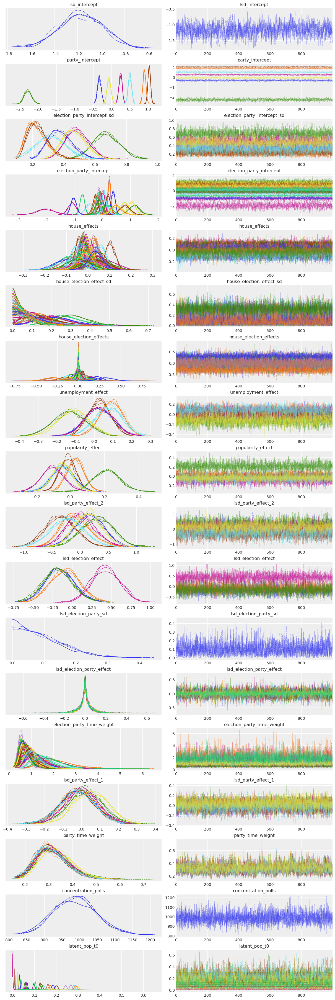

In [45]:
arviz.plot_trace(
    idata_hierarchical_dm,
    var_names=[
        "~time_effect",
        "~time_coefs",
        "~latent_popularity",
        "~noisy_popularity",
        "~raw",
    ],
    filter_vars="regex",
);

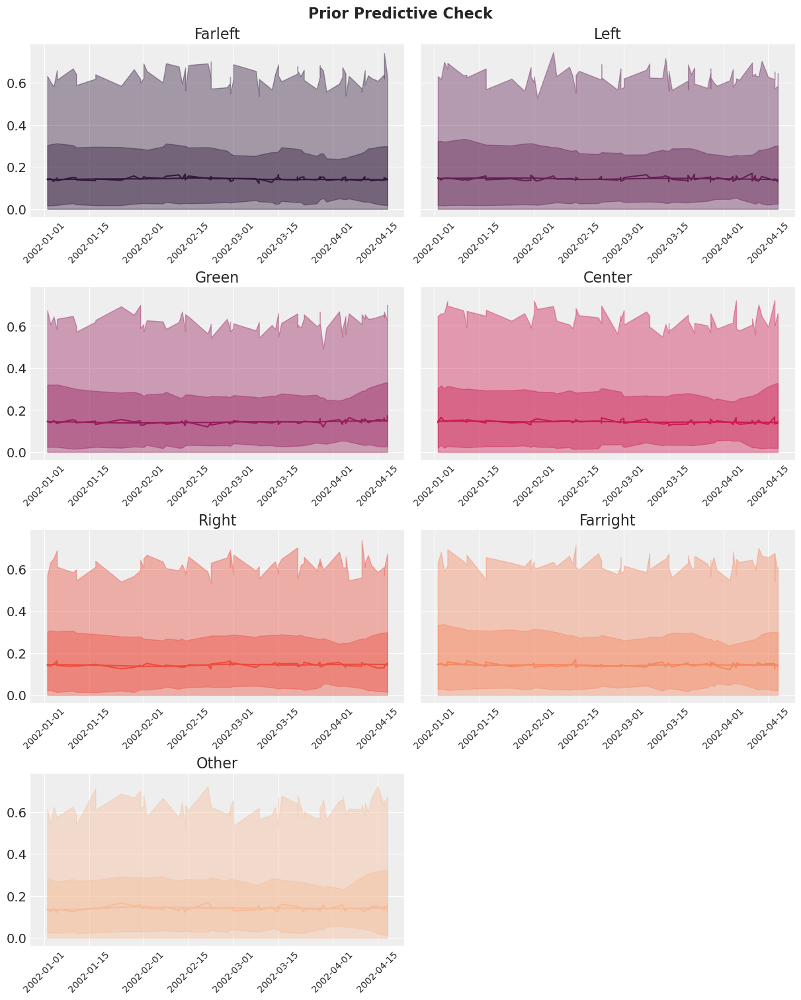

In [63]:
retrodictive_plot(
    idata_hierarchical_dm.sel(
        elections="2002-04-21",
        observations=polls_train[polls_train.dateelection == "2002-04-21"].index,
    ),
    PARTIES_COMPLETE,
    polls_train[polls_train.dateelection == "2002-04-21"],
    group="prior",
)

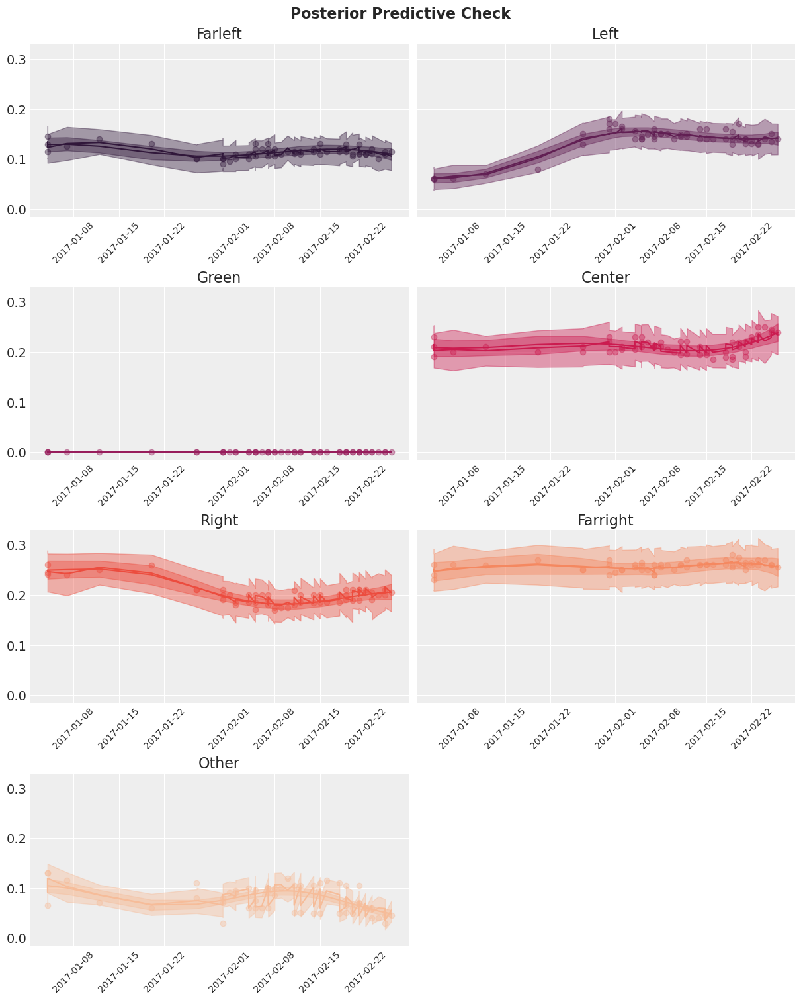

In [46]:
election_date = "2017-04-23"
retrodictive_plot(
    idata_hierarchical_dm.sel(
        elections=election_date,
        observations=polls_train[polls_train.dateelection == election_date].index,
    ),
    PARTIES_COMPLETE,
    polls_train[polls_train.dateelection == election_date],
    group="posterior",
)

In [31]:
def forecast_election(
    idata,
):
    countdown = idata.posterior["countdown"]  # [1:]
    elections = idata.posterior["elections"]

    estimated_days = np.tile(countdown[::-1], reps=len(elections))
    N_estimated_days = len(estimated_days)

    new_dates = []
    for date in elections.data:
        new_dates.append(
            pd.date_range(
                periods=max(countdown.data) + 1,
                end=date,
                freq="D",  # closed="left"
            ).to_series()
        )
    new_dates = pd.concat(new_dates).index

    oos_data = pd.DataFrame.from_dict(
        {
            "countdown": estimated_days,
            "dateelection": np.repeat(UNIQUE_ELECTIONS, repeats=len(countdown)),
            "sondage": np.random.choice(UNIQUE_POLLSTERS, size=N_estimated_days),
            "samplesize": np.random.choice(
                polls_train["samplesize"].values, size=N_estimated_days
            ),
        }
    )
    oos_data["date"] = new_dates
    oos_data = oos_data.set_index("date")

    # join with predictors
    oos_data["quarter"] = oos_data.index.to_period("Q")
    oos_data["month"] = oos_data.index.to_period("M")

    oos_data = oos_data.join(unemp, on="quarter").join(popularity, on="month")
    # check no misisng values
    np.testing.assert_allclose(0, oos_data.isna().any().mean())

    # stdz predictors based on observed values
    oos_data["unemployment"] = (
        oos_data["unemployment"] - cont_preds["unemployment"].mean()
    ) / cont_preds["unemployment"].std()
    oos_data["mean_pop"] = (
        oos_data["mean_pop"] - cont_preds["mean_pop"].mean()
    ) / cont_preds["mean_pop"].std()

    oos_data = oos_data.reset_index()

    forecast_data_index = pd.DataFrame(
        data=0,  # just a placeholder
        index=pd.MultiIndex.from_frame(oos_data),
        columns=PARTIES_COMPLETE,
    )
    forecast_data = forecast_data_index.reset_index()

    PREDICTION_COORDS = {"observations": new_dates}
    PREDICTION_DIMS = {
        "latent_popularity": ["observations", "parties_complete"],
        "noisy_popularity": ["observations", "parties_complete"],
        "N_approve": ["observations", "parties_complete"],
    }

    forecast_model = model_factory(
        {
            "polls_train": forecast_data,
            "campaign_preds": forecast_data,
            "results_oos": results_oos,
            "results_preds": results_preds,
        },
        PARTIES_COMPLETE,
    )
    with forecast_model:
        ppc = pm.sample_posterior_predictive(
            idata,
            var_names=[
                "latent_popularity",
                "noisy_popularity",
                "N_approve",
                "latent_pop_t0",
                "R",
            ],
        )
        ppc = arviz.from_pymc3_predictions(
            ppc,
            idata_orig=idata,
            inplace=False,
            coords=PREDICTION_COORDS,
            dims=PREDICTION_DIMS,
        )

    return ppc

In [47]:
election_forecast = forecast_election(idata_hierarchical_dm)

In [59]:
polls_train.dateelection.unique()

array(['2002-04-21T00:00:00.000000000', '2007-04-22T00:00:00.000000000',
       '2012-04-22T00:00:00.000000000', '2017-04-23T00:00:00.000000000'],
      dtype='datetime64[ns]')

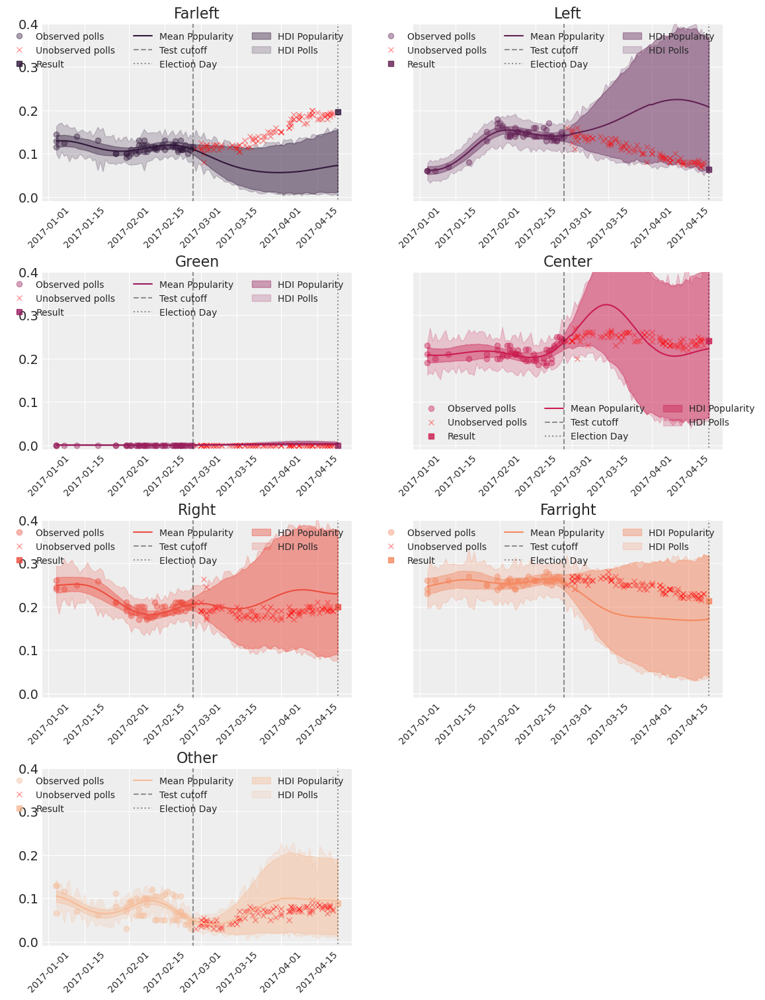

In [48]:
election_date = "2017-04-23"
predictive_plot(
    election_forecast,
    PARTIES_COMPLETE,
    election_date,
    results[results.dateelection == election_date],
    polls_train[polls_train.dateelection == election_date],
    polls_test[polls_test.dateelection == election_date],
    TEST_CUTOFF,
)
# plt.savefig("ppc.png")

In [ ]:
# results PPC

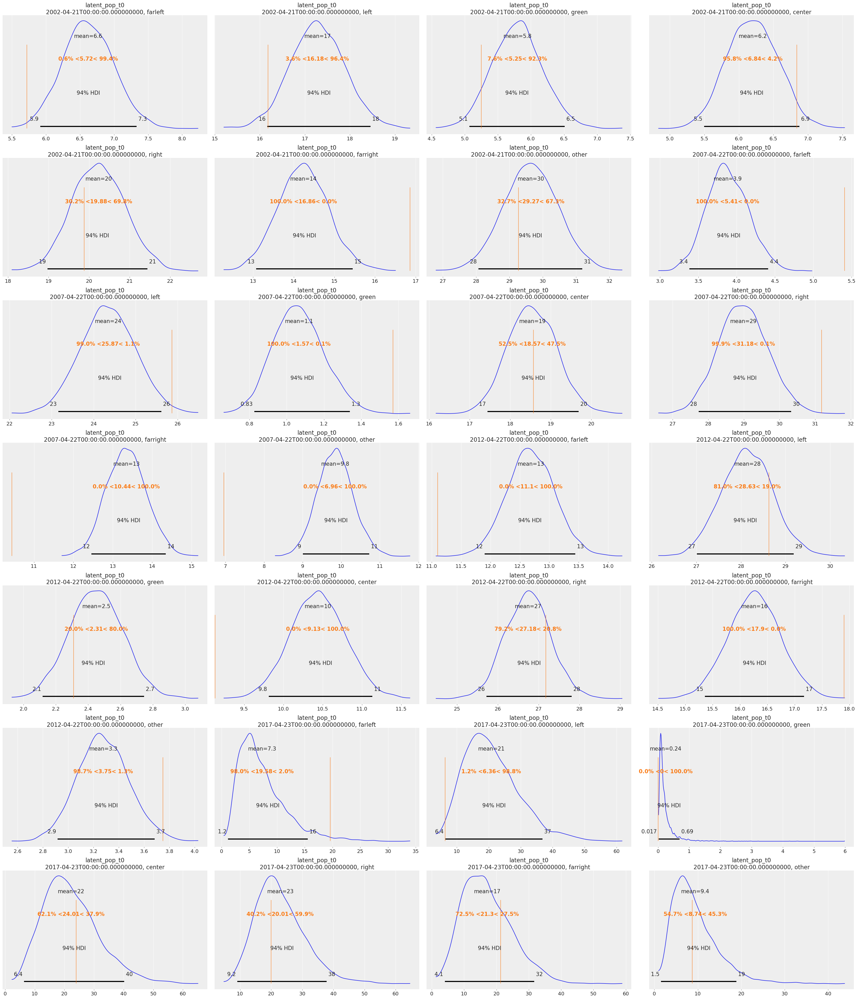

In [49]:
arviz.plot_posterior(
    election_forecast.predictions["latent_pop_t0"] * 100,
    ref_val=results[PARTIES_COMPLETE].to_numpy().flatten().tolist(),
);

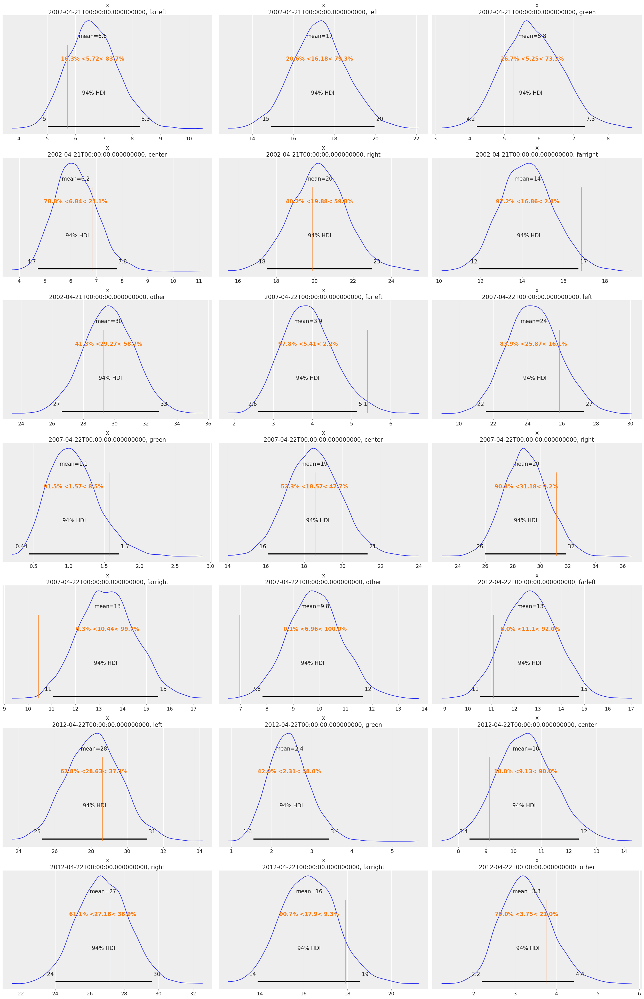

In [51]:
arviz.plot_posterior(
    (
        election_forecast.predictions["R"]
        / election_forecast.predictions_constant_data["results_N"]
    )
    * 100,
    ref_val=results[PARTIES_COMPLETE].to_numpy().flatten().tolist(),
)
plt.savefig("ppc_results.png");

In [5]:
import pandas as pd

In [32]:
TEST_CUTOFF = pd.Timedelta(8, "W")
mb = ModelBuilder(election_to_predict="2017-04-23", test_cutoff=TEST_CUTOFF)
hierarchical_dm = mb.build_model()

/Users/alex_andorra/repos/pollsposition/models/presidential-elections/model_builder.py:128: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], date).astype(int)


In [33]:
idata_hierarchical_dm = mb.sample_all(
    var_names=[
        "latent_popularity",
        "latent_pop_t0",
        "R",
        "noisy_popularity",
        "N_approve",
    ]
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_2, lsd_party_effect_1, lsd_intercept, popularity_effect, unemployment_effect, house_election_effects_raw, house_election_effect_sd, house_effects, election_party_intercept, election_party_intercept_sd, party_intercept]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 635 seconds.


In [19]:
import arviz

In [21]:
arviz.style.use("arviz-darkgrid")

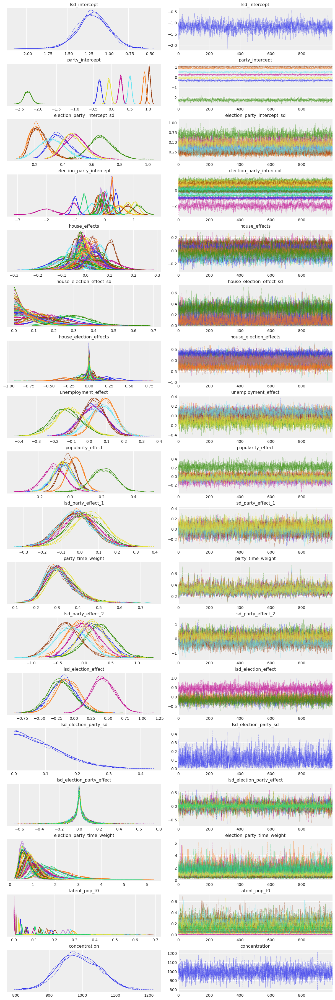

In [34]:
arviz.plot_trace(
    idata_hierarchical_dm,
    var_names=[
        "~time_effect",
        "~time_coefs",
        "~latent_popularity",
        "~noisy_popularity",
        "~raw",
    ],
    filter_vars="regex",
);

In [24]:
from posteriorplots import predictive_plot, retrodictive_plot

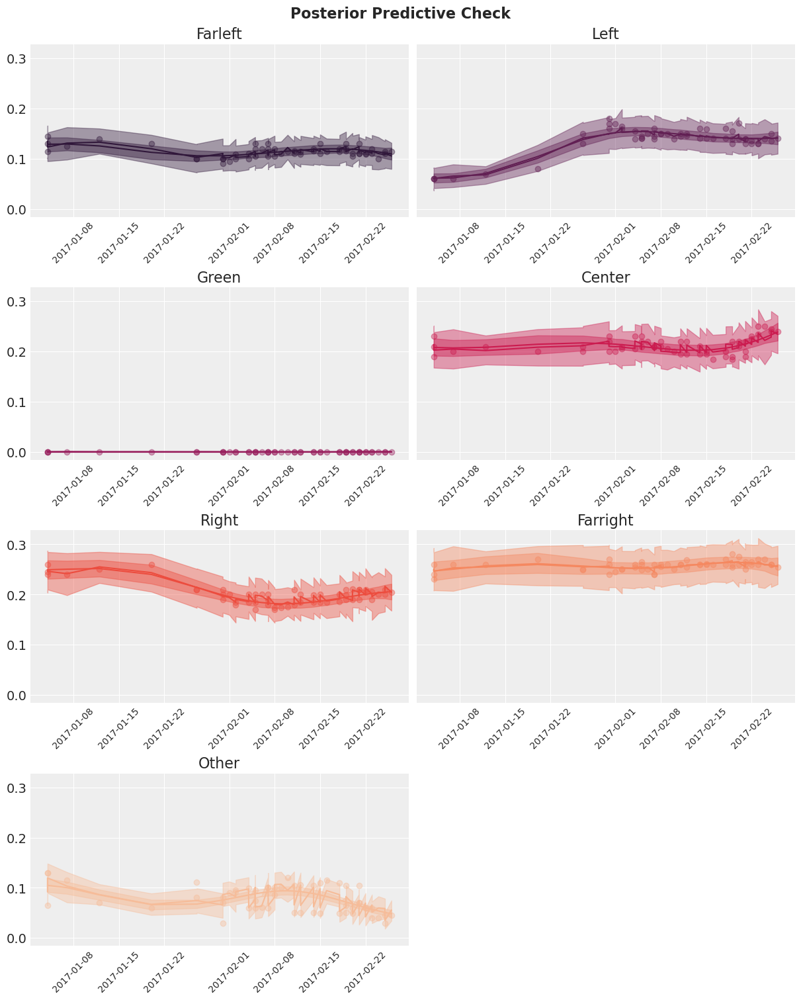

In [35]:
election_date = "2017-04-23"
polls_train = mb.polls_train.copy()
retrodictive_plot(
    idata_hierarchical_dm.sel(
        elections=election_date,
        observations=polls_train[polls_train.dateelection == election_date].index,
    ),
    mb.parties_complete,
    polls_train[polls_train.dateelection == election_date],
    group="posterior",
)

In [36]:
election_forecast = mb.forecast_election(idata_hierarchical_dm)

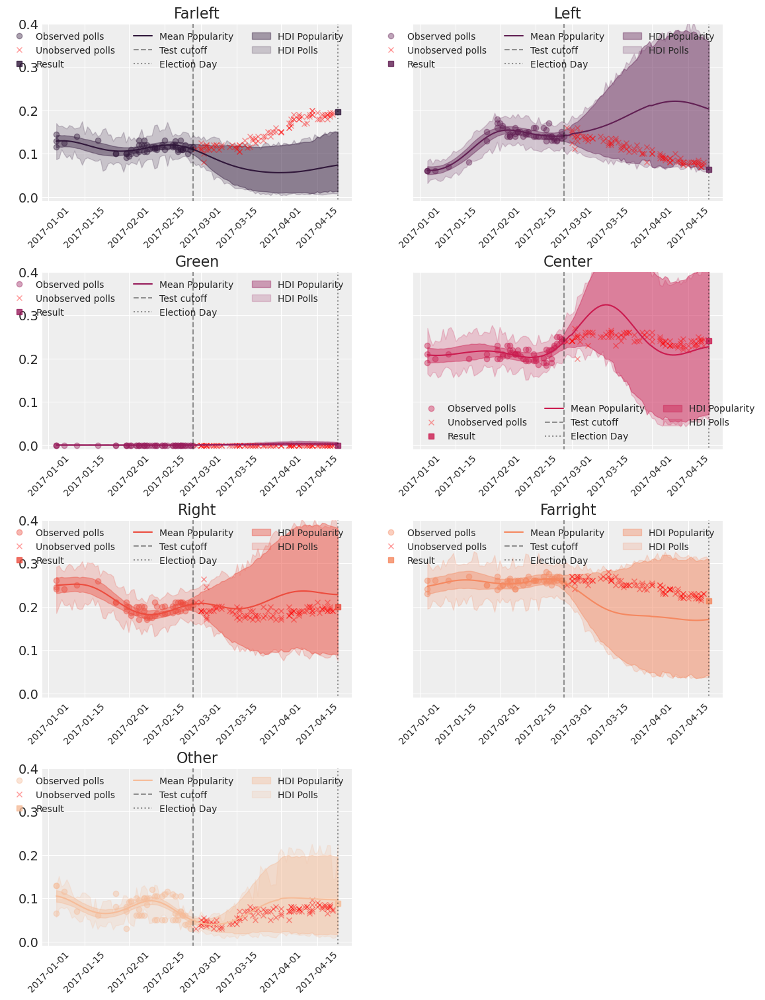

In [39]:
election_date = "2017-04-23"
results = mb.results_raw
polls_test = mb.polls_test

predictive_plot(
    election_forecast,
    mb.parties_complete,
    election_date,
    results[results.dateelection == election_date],
    polls_train[polls_train.dateelection == election_date],
    polls_test[polls_test.dateelection == election_date],
    TEST_CUTOFF,
)
# plt.savefig("ppc.png")

In [ ]:
# results PPC

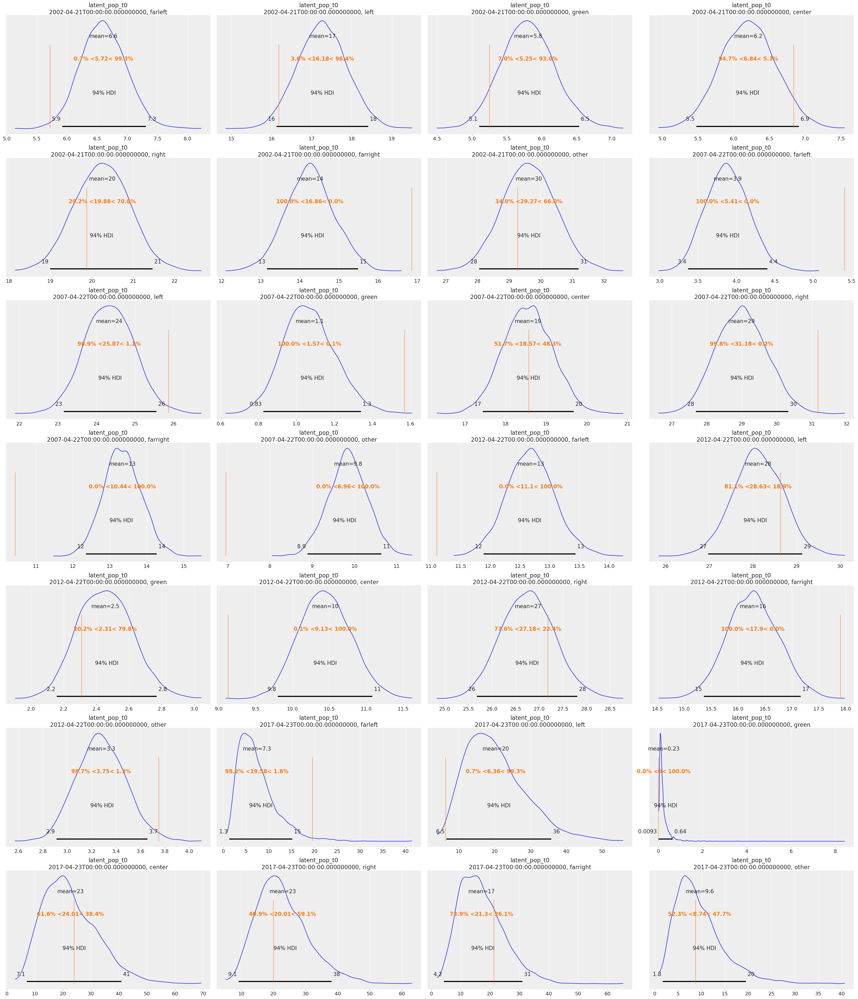

In [40]:
arviz.plot_posterior(
    election_forecast.predictions["latent_pop_t0"] * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);

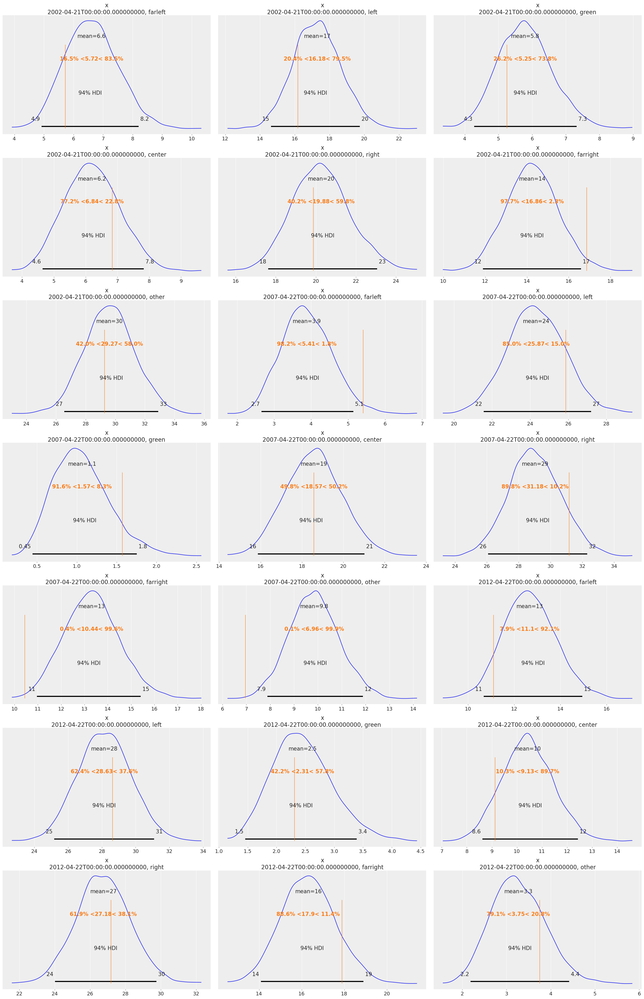

In [42]:
arviz.plot_posterior(
    (
        election_forecast.predictions["R"]
        / election_forecast.predictions_constant_data["results_N"]
    )
    * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);
#plt.savefig("ppc_results.png");

In [26]:
# covarying GP (transition matrix)

In [ ]:
# https://www.itl.nist.gov/div898/handbook/eda/section3/qqplot.htm
# add other election types (https://github.com/pollsposition/models/blob/master/district-level/munic_model_prod.ipynb)